## Using GAN to Generate New Pokémons

<img src= "https://nintendoeverything.com/wp-content/uploads/sites/1/nggallery/pokemon-sword-shield-22720/In-Game-Screenshot-2.jpg" style='width: 450px;'>

## Problem statement

This is a project about creating & building a GAN (DCGAN) model, to **generate new imaginary pokemons' images** based on a random seed value.

The dataset consists of many images of pokemons, which will be used as the training data.

I will use **PyTorch** library to create / import some models, and optimize & evaluate the model parameters to finalize the submission output.

The training pipeline is designed based on **[this](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html)** official PyTorch tutorial.

## Environment setup

In [1]:
from __future__ import print_function

from PIL import Image
from IPython.display import HTML

import os
import torch
import random
import argparse
import torch.utils.data
import torch.nn.parallel

import numpy as np
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import torchvision.utils as vutils
import torchvision.datasets as dset
import torch.backends.cudnn as cudnn
import matplotlib.animation as animation
import torchvision.transforms as transforms

manualSeed = random.randint(1, 10000)
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  9652


## Defining hyperparameters

In [2]:
dir_pokemon = "../input/pokemon-images-dataset/pokemon/"

# Number of workers for pytorch dataloader
num_workers = 2

image_dim = 64
color_dim = 3

latent_dim = 128

generator_feature_dim = 64
discriminator_feature_dim = 64

num_epochs = 400

lr = 0.0002
beta1 = 0.5

# Number of GPUs available
num_gpus = 1

batch_size = 64

## Importing images & Basic EDA

In [3]:
files_pokemon = os.listdir(dir_pokemon + '/pokemon')

num_pokemon = len(files_pokemon)

print(num_pokemon)

image = Image.open("../input/pokemon-images-dataset/pokemon_jpg/pokemon_jpg/1.jpg")

width, height = image.size

print(f"Image dimension: {width} x {height}")

819
Image dimension: 256 x 256


### Examining dimension of the data

There are a total of **819** images of pokemon, and their dimension is **256x256.**

This is not a big number compared to competitions that has hundereds of thousands of images to train, but since there's usually a higher number of iterations needed for convergence of GANs compared to CNNs, I still should be aware of that when designing models and preparing the data.

I will decrease the image's dimension to **64x64** for faster training, since computational resources are very limited.

Even though the file names are not consistent, I will use **ImageFolder** class that will handle these images by directory easily, so there's no additional transformations needed.

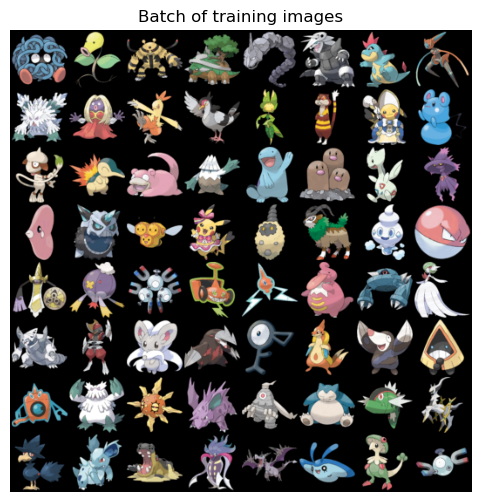

In [4]:
# Create the dataset
dataset = dset.ImageFolder(root=dir_pokemon,
                           transform=transforms.Compose([
                               transforms.Resize(image_dim),
                               transforms.CenterCrop(image_dim),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=num_workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and num_gpus > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(6, 6))
plt.axis("off")
plt.title("Batch of training images")
plt.imshow(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu().numpy().transpose(1,2,0))

### Examining images

It's quite nostalgic, most of them are based on a **casual artstyle,** with their colors and textures representing their types. (fire, water...)

Even though their drawing styles are simple, they have **thin and black outlines,** and the resolution of the images are **quite high.**

These characteristics of the images makes **smaller kernel sizes** appropriate for the generator model. It should also be noted that the default background color is black, since the training images are transparent images with an alpha value.

## Defining model architecture

I will build a general **DCGAN** model, consisting of one generator and discriminator model each.

The generator model will be as follows:

**Input -> (ConvTranspose2D -> BatchNorm -> ReLU) * 4 -> ConvTranspose2D -> Output**

**ReLU** is used here instead of **LeakyReLU** because the model architecture is not that deep, (lower risk of dying ReLU) and the computational resource is limited.

**Conv2DTranspose** is there instead of upsampling to make the model less linear and to let more complex features fit into the model.

There will be **tanh** activation function for the last layer, to adjust the final **color range to (-1, 1).**

Next, the discriminator model will be as follows:

**Input -> Conv2D -> LeakyReLU -> (Conv2D -> BatchNorm -> LeakyReLU) * 3 -> Conv2D -> Output**

Where there will be a **sigmoid** activation function for **BCE** at the last layer.

**Batch normalization** was omited at the first layer, to enable natural normalization on the input. 

Plus, using **LeakyReLU** for discriminator will let the discriminator handle negative inputs better.

## Defining kernel initializer

In [5]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## Defining Generator

In [6]:
class Generator(nn.Module):
    def __init__(self, num_gpus):
        super(Generator, self).__init__()
        self.num_gpus = num_gpus
        self.main = nn.Sequential(
            
            nn.ConvTranspose2d(latent_dim, generator_feature_dim * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(generator_feature_dim * 8),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(generator_feature_dim * 8, generator_feature_dim * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(generator_feature_dim * 4),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(generator_feature_dim * 4, generator_feature_dim * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(generator_feature_dim * 2),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(generator_feature_dim * 2, generator_feature_dim, 4, 2, 1, bias=False),
            nn.BatchNorm2d(generator_feature_dim),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(generator_feature_dim, color_dim, 4, 2, 1, bias=False),
            nn.Tanh()
            
        )

    def forward(self, input):
        return self.main(input)

In [7]:
# Create the generator
model_generator = Generator(num_gpus).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (num_gpus > 1):
    model_generator = nn.DataParallel(model_generator, list(range(num_gpus)))

# Apply the weights_init function to randomly initialize all weights
model_generator.apply(weights_init)

# Print the model
print(model_generator)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


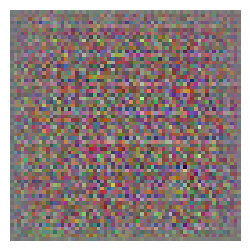

In [8]:
random_latent_vector = torch.randn(1, latent_dim, 1, 1, device=device)

generated_image = model_generator(random_latent_vector)

plt.figure(figsize=(3, 3))
plt.imshow(vutils.make_grid(generated_image, normalize=True).cpu().numpy().transpose(1, 2, 0))
plt.axis('off')
plt.show()

### Checking initialized kernel

The initialization looks good, this will help the model **learn colors faster.**

## Defining Discriminator

In [9]:
class Discriminator(nn.Module):
    def __init__(self, num_gpus):
        super(Discriminator, self).__init__()
        self.num_gpus = num_gpus
        self.main = nn.Sequential(
            
            nn.Conv2d(color_dim, discriminator_feature_dim, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(discriminator_feature_dim, discriminator_feature_dim * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(discriminator_feature_dim * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(discriminator_feature_dim * 2, discriminator_feature_dim * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(discriminator_feature_dim * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(discriminator_feature_dim * 4, discriminator_feature_dim * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(discriminator_feature_dim * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(discriminator_feature_dim * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            
        )

    def forward(self, input):
        return self.main(input)

In [10]:
# Create the Discriminator
model_discriminator = Discriminator(num_gpus).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (num_gpus > 1):
    model_discriminator = nn.DataParallel(model_discriminator, list(range(num_gpus)))

# Apply the weights_init function to randomly initialize all weights
model_discriminator.apply(weights_init)

# Print the model
print(model_discriminator)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [11]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Fixed noise for displaying example outputs
fixed_noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(model_discriminator.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(model_generator.parameters(), lr=lr, betas=(beta1, 0.999))

## Defining & training DCGAN model

In [12]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        # Training discriminator
        
        ## Train with all-real batch
        model_discriminator.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        batch_size = real_cpu.size(0)
        label = torch.full((batch_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch
        output_real = model_discriminator(real_cpu).view(-1)
        # Calculate loss on all-real batch
        loss_real = criterion(output_real, label)
        # Calculate gradients in backward pass
        loss_real.backward()
        
        D_x = output_real.mean().item()

        ## Train with all-fake batch
        noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)
        # Generate fake image batch
        fake = model_generator(noise)
        label.fill_(fake_label)
        # Classify all fake batch
        output_fake = model_discriminator(fake.detach()).view(-1)
        # Calculate loss on the all-fake batch
        loss_fake = criterion(output_fake, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        loss_fake.backward()
        
        D_G_z1 = output_fake.mean().item()
        
        loss_discriminator = loss_real + loss_fake
        
        # Update discriminator
        optimizerD.step()
        
        # Training generator
        
        model_generator.zero_grad()
        label.fill_(real_label)
        # perform another forward pass of all-fake batch
        output_generator = model_discriminator(fake).view(-1)
        # Calculate loss based on this output
        loss_generator = criterion(output_generator, label)
        # Calculate gradients
        loss_generator.backward()
        
        D_G_z2 = output_generator.mean().item()
        
        # Update generator
        optimizerG.step()

        # Output training stats
        if epoch % 50 == 0 and i == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     loss_discriminator.item(), loss_generator.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(loss_generator.item())
        D_losses.append(loss_discriminator.item())

        # Check how the generator is doing by saving output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = model_generator(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/400][0/13]	Loss_D: 1.6171	Loss_G: 3.8801	D(x): 0.4328	D(G(z)): 0.4177 / 0.0269
[50/400][0/13]	Loss_D: 0.4032	Loss_G: 2.8100	D(x): 0.7238	D(G(z)): 0.0414 / 0.0877
[100/400][0/13]	Loss_D: 0.4922	Loss_G: 4.6585	D(x): 0.8706	D(G(z)): 0.2377 / 0.0140
[150/400][0/13]	Loss_D: 1.3951	Loss_G: 2.1246	D(x): 0.4701	D(G(z)): 0.1087 / 0.2884
[200/400][0/13]	Loss_D: 0.0415	Loss_G: 4.9087	D(x): 0.9848	D(G(z)): 0.0252 / 0.0120
[250/400][0/13]	Loss_D: 0.8695	Loss_G: 3.7319	D(x): 0.8525	D(G(z)): 0.4094 / 0.0439
[300/400][0/13]	Loss_D: 0.0244	Loss_G: 5.3150	D(x): 0.9920	D(G(z)): 0.0161 / 0.0071
[350/400][0/13]	Loss_D: 0.0145	Loss_G: 6.0293	D(x): 0.9928	D(G(z)): 0.0071 / 0.0041


## Evaluating DCGAN model

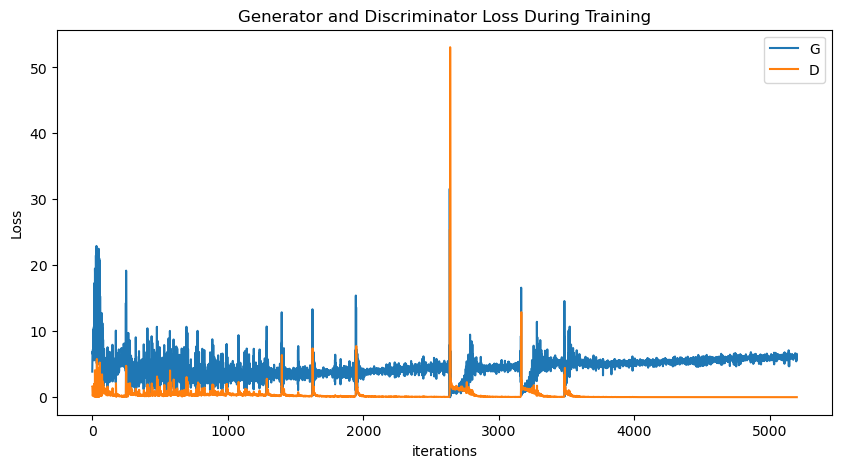

In [13]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

### Examining loss plot of the model

The trend of the loss is consistent overall, and even though the generator loss is higher, there's no significant signs of overpowering.

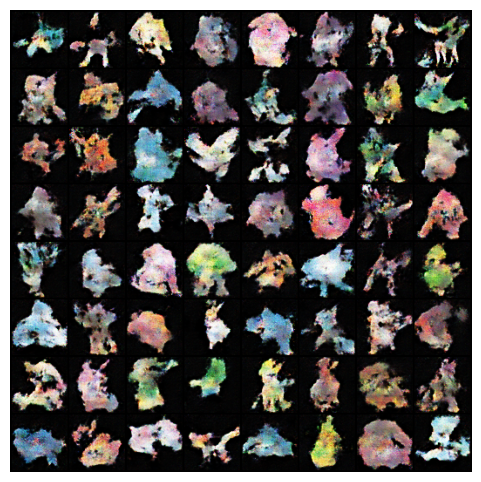

In [14]:
fig = plt.figure(figsize=(6, 6))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

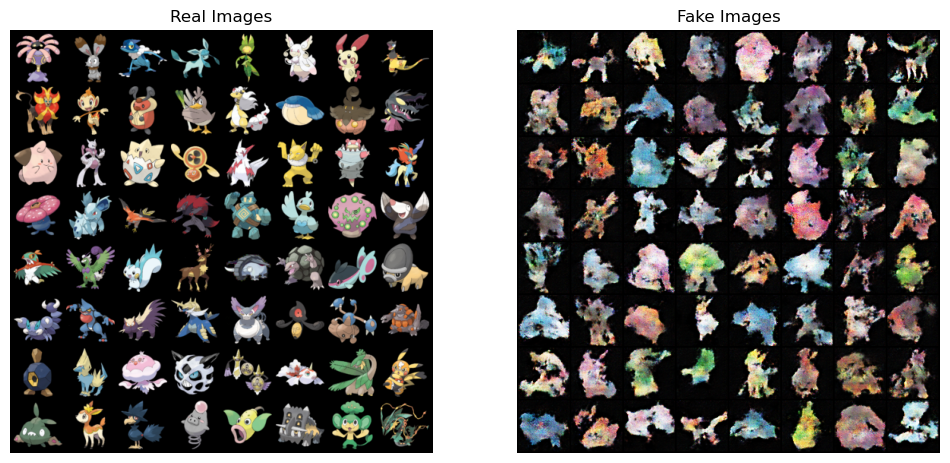

In [15]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(12, 6))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

### Examining generated pokemons

Cool! Their details are not quite perfect, but considering the limited epoch and the model capacity, I think this is a good enough result, with **identifiable silhouettes** and **consistent color palette**.

## Conclusion

**DCGAN** generator model with **Transpose, ReLU and BatchNormalization layers** showed good performance in creating imaginary pokemon images.

The model was able to learn the **"shape"** of the pokemons fairly quickly, but it took some time learning their colors.

Additional measures like **initializing the kernel,** adjusting the **latent dimension** of the input noise vector, and using the **beta_1** parameter of the optimizer helped improve the performance of the model, and training the discriminator before the generator allowed the loss to be more consistent.